# <center>        **Portfolio Management**</center>

# 1. Business Understanding

Business Understanding of the problem which addresses the following questions.

   1. What is the business problem that you are trying to solve?
   2. What data do you need to answer the above problem?
   3. What are the different sources of data?
   4. What kind of analytics task are you performing?

1. **Business problem**
To develop an intelligent portfolio management system that leverages data analysis, feature engineering, and machine learning to provide investors with actionable insights for informed decision-making and risk mitigation in the stock market.


*   **Core Functionalities:**

 Comprehensive Stock Analysis: Evaluate individual stocks using financial ratios, Beta, and historical prices to assess their financial health, risk, and potential returns.
*   **Portfolio Optimization:**

 Employ correlation analysis and machine learning to build diversified portfolios that minimize risk and maximize returns.

*   **Decision Support:**

 Offer data-driven recommendations on stock selection, portfolio allocation, and risk management strategies.


2.
The data includes key financial ratios like PE Ratio, Dividend Yield, Return on Equity, and Debt to Equity Ratio which can be used to evaluate the financial health and potential of different companies for investment.

  Beta can help assess the systematic risk associated with a particular stock compared to the overall market.

  52 Week High and 52 Week Low provide insights into the stock's recent price performance and potential volatility.


3. **Dataset:** We have used a program for random generation of the dataset with 20 attributes and 11500 entries.


4. **Analytic tasks used are:**

- Data Preparation- Identified and removed data inconsistencies
- Data Exploration- Using Scatter plot, histogram, heatmaps, pair plot etc
- Data Wrangling- Using mutual information, gini index, gain ration, Chi square
  tests and strength of association
- Use of ML techniques- Classification & Clustering to help us management of the portfolio


# 2. Data Acquisition

For the problem identified , Data set we are taking
are unique with minimum **20 features and 10k rows**) from any public data source.

---


## 2.1 Download the data directly



In [33]:
## we have used the below code to generate random data for us ##

import pandas as pd
import numpy as np
import random

# Generate data for 11000 stocks
num_stocks = 11000
data = {
    'Company Name': [f'Company_{i}' for i in range(1, num_stocks + 1)],
    'Industry': [random.choice(['Technology', 'Finance', 'Healthcare', 'Retail', 'Energy']) for _ in range(num_stocks)],
    'Open': [round(random.uniform(10, 1000), 2) for _ in range(num_stocks)],
    'Close': [round(random.uniform(10, 1000), 2) for _ in range(num_stocks)],
    'High': [round(random.uniform(10, 1000), 2) for _ in range(num_stocks)],
    'Low': [round(random.uniform(10, 1000), 2) for _ in range(num_stocks)],
    'Volume': [random.randint(10000, 1000000) for _ in range(num_stocks)],
    'Market Cap': [random.randint(10000000, 1000000000) for _ in range(num_stocks)],
    'EPS': [round(random.uniform(0, 10), 2) for _ in range(num_stocks)],
    'PE Ratio': [round(random.uniform(10, 50), 2) for _ in range(num_stocks)],
    'Dividend Yield': [round(random.uniform(0, 5), 2) for _ in range(num_stocks)],
    'Debt to Equity Ratio': [round(random.uniform(0, 2), 2) for _ in range(num_stocks)],
    'Return on Equity': [round(random.uniform(0, 30), 2) for _ in range(num_stocks)],
    'Current Ratio': [round(random.uniform(1, 3), 2) for _ in range(num_stocks)],
    'Quick Ratio': [round(random.uniform(0.5, 2), 2) for _ in range(num_stocks)],
    'Cash Flow from Operations': [random.randint(1000000, 100000000) for _ in range(num_stocks)],
    'Free Cash Flow': [random.randint(1000000, 100000000) for _ in range(num_stocks)],
    'Beta': [round(random.uniform(0.5, 1.5), 2) for _ in range(num_stocks)],
    '52 Week High': [round(random.uniform(10, 1000), 2) for _ in range(num_stocks)],
    '52 Week Low': [round(random.uniform(10, 1000), 2) for _ in range(num_stocks)]
}

df = pd.DataFrame(data)

# Introduce data inconsistencies
# Replace some values with NaN
df.loc[random.sample(range(num_stocks), 1000), 'Open'] = np.nan
df.loc[random.sample(range(num_stocks), 500), 'Close'] = np.nan
df.loc[random.sample(range(num_stocks), 800), 'EPS'] = np.nan
df.loc[random.sample(range(num_stocks), 700), 'PE Ratio'] = np.nan

# Introduce some incorrect data types
df.loc[random.sample(range(num_stocks), 300), 'Volume'] = 'N/A'
df.loc[random.sample(range(num_stocks), 200), 'Market Cap'] = 'Not Available'

# Duplicate some rows
df = pd.concat([df, df.sample(n=500)], ignore_index=True)

<ipython-input-33-a89b09529815>:44: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'N/A' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[random.sample(range(num_stocks), 300), 'Volume'] = 'N/A'
<ipython-input-33-a89b09529815>:45: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Not Available' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[random.sample(range(num_stocks), 200), 'Market Cap'] = 'Not Available'


## 2.2 Code for converting the above downloaded data into a dataframe

In [34]:
## Note: conversion to df is in previous step itself ##

# Save the DataFrame to an Excel file
df.to_excel('indian_stocks6.xlsx', index=False)

## 2.3 Confirm the data has been correctly by displaying the first 5 and last 5 records.

In [35]:
display(df.head(5))
display(df.tail(5))

,Company Name,Industry,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,Return on Equity,Current Ratio,Quick Ratio,Cash Flow from Operations,Free Cash Flow,Beta,52 Week High,52 Week Low
0,Company_1,Finance,NaN,486.21,340.91,707.97,795264,24116442,1.23,NaN,1.59,0.93,21.81,1.23,1.14,15290373,23535656,1.48,458.34,243.75
1,Company_2,Finance,132.44,642.99,346.80,282.44,990359,599646935,4.15,18.01,2.84,0.97,24.23,2.35,1.57,23257338,29821079,0.67,803.92,866.78
2,Company_3,Energy,399.86,545.95,56.96,710.60,729923,516076814,1.32,15.33,0.88,0.84,17.35,1.56,0.98,70255110,34155800,1.35,291.39,209.62
3,Company_4,Energy,148.28,NaN,253.80,70.42,573471,579862750,2.34,17.66,1.56,1.83,5.83,2.62,1.61,54451429,1720999,0.77,574.97,365.45
4,Company_5,Energy,223.34,541.53,102.31,677.07,470193,118949662,0.85,14.73,1.98,1.51,27.78,1.87,1.10,91643737,86993386,0.99,487.05,130.18


,Company Name,Industry,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,Return on Equity,Current Ratio,Quick Ratio,Cash Flow from Operations,Free Cash Flow,Beta,52 Week High,52 Week Low
11495,Company_160,Technology,670.51,686.04,850.20,146.30,659031,453125632,4.81,22.20,3.91,0.90,22.04,2.48,0.83,54806961,86449522,1.17,191.57,345.05
11496,Company_2689,Technology,326.04,602.02,214.44,239.93,802804,406281184,6.75,43.90,4.71,1.77,1.89,2.86,1.63,99202005,43654319,0.68,494.81,449.42
11497,Company_9956,Healthcare,109.68,622.46,729.34,52.32,688104,546116227,2.37,42.31,2.89,1.10,13.39,2.80,1.91,87552054,20009865,0.68,155.10,302.94
11498,Company_879,Retail,531.50,651.36,441.39,813.45,798423,22597992,6.53,43.93,3.71,1.74,27.71,2.01,1.53,85574972,76036634,0.61,536.70,312.48
11499,Company_3933,Energy,159.78,407.20,489.42,595.42,408081,262663049,5.22,31.65,3.06,0.14,7.99,1.29,1.46,55327752,20568650,0.83,816.58,299.70


## 2.4 Display the column headings, statistical information, description and statistical summary of the data.

In [36]:
display(df.columns)
display(df.describe())
display(df.info())
display(f"The dataset has {df.shape[0]} rows and {df.shape[1]} columns.")
display(df.dtypes)
display("Null data count per column:")
display(df.isnull().sum())

Index(['Company Name', 'Industry', 'Open', 'Close', 'High', 'Low', 'Volume',
       'Market Cap', 'EPS', 'PE Ratio', 'Dividend Yield',
       'Debt to Equity Ratio', 'Return on Equity', 'Current Ratio',
       'Quick Ratio', 'Cash Flow from Operations', 'Free Cash Flow', 'Beta',
       '52 Week High', '52 Week Low'],
      dtype='object')

,Open,Close,High,Low,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,Return on Equity,Current Ratio,Quick Ratio,Cash Flow from Operations,Free Cash Flow,Beta,52 Week High,52 Week Low
count,10452.000000,10959.000000,11500.000000,11500.000000,10658.000000,10774.000000,11500.000000,11500.000000,11500.000000,11500.000000,11500.000000,1.150000e+04,1.150000e+04,11500.000000,11500.000000,11500.000000
mean,508.086791,507.234676,500.851520,511.796983,4.987667,29.978613,2.488746,0.998412,15.009862,2.006869,1.245458,5.059288e+07,5.023469e+07,0.995722,503.201007,500.621153
std,285.638841,286.060973,285.862121,287.286955,2.887179,11.570080,1.452263,0.576013,8.685606,0.575936,0.433112,2.850603e+07,2.846205e+07,0.288620,285.583144,285.676310
min,10.090000,10.020000,10.210000,10.260000,0.000000,10.010000,0.000000,0.000000,0.000000,1.000000,0.500000,1.008077e+06,1.009202e+06,0.500000,10.020000,10.280000
25%,260.812500,259.375000,251.347500,265.040000,2.470000,19.962500,1.240000,0.500000,7.517500,1.510000,0.870000,2.560898e+07,2.602967e+07,0.750000,253.697500,250.542500
50%,511.950000,507.580000,500.820000,513.550000,5.000000,30.110000,2.450000,0.990000,14.940000,2.015000,1.240000,5.069765e+07,5.015346e+07,0.990000,503.065000,498.760000
75%,750.405000,756.185000,746.252500,761.222500,7.510000,39.900000,3.750000,1.500000,22.610000,2.510000,1.620000,7.516707e+07,7.497286e+07,1.240000,750.695000,747.912500
max,999.940000,999.960000,999.890000,999.970000,10.000000,49.990000,5.000000,2.000000,30.000000,3.000000,2.000000,9.998648e+07,9.998301e+07,1.500000,999.800000,999.850000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11500 entries, 0 to 11499
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Company Name               11500 non-null  object 
 1   Industry                   11500 non-null  object 
 2   Open                       10452 non-null  float64
 3   Close                      10959 non-null  float64
 4   High                       11500 non-null  float64
 5   Low                        11500 non-null  float64
 6   Volume                     11500 non-null  object 
 7   Market Cap                 11500 non-null  object 
 8   EPS                        10658 non-null  float64
 9   PE Ratio                   10774 non-null  float64
 10  Dividend Yield             11500 non-null  float64
 11  Debt to Equity Ratio       11500 non-null  float64
 12  Return on Equity           11500 non-null  float64
 13  Current Ratio              11500 non-null  flo

None

'The dataset has 11500 rows and 20 columns.'

,0
Company Name,object
Industry,object
Open,float64
Close,float64
High,float64
Low,float64
Volume,object
Market Cap,object
EPS,float64
PE Ratio,float64


'Null data count per column:'

,0
Company Name,0
Industry,0
Open,1048
Close,541
High,0
Low,0
Volume,0
Market Cap,0
EPS,842
PE Ratio,726


## 2.5 Write observations from the above.
1. Size of the dataset
2. What type of data attributes are there?
3. Is there any null data that has to be cleaned?

# 3. Data Preparation

## 3.1 Check for

* duplicate data
* missing data
* data inconsistencies


In [37]:
duplicate_rows = df[df.duplicated()]
display("Number of duplicate rows:", duplicate_rows.shape[0])
display(duplicate_rows)

missing_data = df.isnull().sum()
display(missing_data)

non_numeric_volume = df[~df['Volume'].apply(lambda x: isinstance(x, (int, float)))]
display("Rows with non-numeric values in 'Volume' column:")
display(non_numeric_volume)

non_numeric_market_cap = df[~df['Market Cap'].apply(lambda x: isinstance(x, (int, float)))]
display("Rows with non-numeric values in 'Market Cap' column:")
display(non_numeric_market_cap)

'Number of duplicate rows:'

500

,Company Name,Industry,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,Return on Equity,Current Ratio,Quick Ratio,Cash Flow from Operations,Free Cash Flow,Beta,52 Week High,52 Week Low
11000,Company_7416,Healthcare,408.41,954.19,459.12,465.83,830369,567882585,5.73,43.35,0.85,0.51,17.72,2.43,1.02,16305087,4890383,1.37,282.19,143.15
11001,Company_4488,Retail,101.02,593.53,556.97,966.59,429460,910225316,2.30,12.41,1.06,0.58,22.10,1.98,1.63,25148205,28151494,0.84,972.43,288.08
11002,Company_1119,Retail,256.41,978.40,956.02,97.00,290395,320234497,3.31,36.58,1.11,0.89,22.49,2.36,1.37,68006366,85711090,0.52,121.64,516.70
11003,Company_1764,Technology,813.23,736.13,887.28,177.44,328575,955019442,9.61,NaN,1.41,0.42,14.83,2.45,1.94,38044040,33890404,1.37,479.86,481.28
11004,Company_1994,Technology,227.87,217.42,659.74,145.76,142602,894482420,6.73,37.99,2.48,1.44,9.69,2.51,1.32,70371504,25023746,1.29,709.40,512.76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11495,Company_160,Technology,670.51,686.04,850.20,146.30,659031,453125632,4.81,22.20,3.91,0.90,22.04,2.48,0.83,54806961,86449522,1.17,191.57,345.05
11496,Company_2689,Technology,326.04,602.02,214.44,239.93,802804,406281184,6.75,43.90,4.71,1.77,1.89,2.86,1.63,99202005,43654319,0.68,494.81,449.42
11497,Company_9956,Healthcare,109.68,622.46,729.34,52.32,688104,546116227,2.37,42.31,2.89,1.10,13.39,2.80,1.91,87552054,20009865,0.68,155.10,302.94
11498,Company_879,Retail,531.50,651.36,441.39,813.45,798423,22597992,6.53,43.93,3.71,1.74,27.71,2.01,1.53,85574972,76036634,0.61,536.70,312.48


,0
Company Name,0
Industry,0
Open,1048
Close,541
High,0
Low,0
Volume,0
Market Cap,0
EPS,842
PE Ratio,726


"Rows with non-numeric values in 'Volume' column:"

,Company Name,Industry,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,Return on Equity,Current Ratio,Quick Ratio,Cash Flow from Operations,Free Cash Flow,Beta,52 Week High,52 Week Low
21,Company_22,Retail,791.07,72.31,698.89,24.23,N/A,609655742,0.83,NaN,1.38,1.40,25.47,2.63,1.95,72986737,62972079,0.75,422.88,185.17
25,Company_26,Energy,NaN,148.76,950.02,249.47,N/A,231075480,NaN,30.35,1.29,0.15,3.83,2.08,1.53,43960158,63620435,1.12,810.72,329.44
26,Company_27,Finance,855.16,457.43,980.44,90.35,N/A,303335010,0.12,21.65,0.60,1.46,18.13,2.78,0.78,75789061,42625720,0.86,389.13,987.12
31,Company_32,Healthcare,517.51,NaN,974.95,825.53,N/A,197625754,6.31,21.40,2.42,0.62,25.83,2.78,1.38,29776143,14175085,1.14,164.73,854.57
39,Company_40,Retail,113.60,922.46,510.59,866.53,N/A,174273495,0.44,40.99,0.57,1.39,11.22,2.44,0.81,5857410,18409486,1.39,159.40,789.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11268,Company_3892,Energy,540.94,643.97,15.85,125.12,N/A,922711360,1.34,NaN,1.29,0.35,29.33,1.64,1.83,84997115,99769139,1.42,386.24,347.60
11359,Company_2008,Finance,934.85,671.70,664.72,890.62,N/A,649615149,1.06,20.53,2.04,0.01,21.75,2.02,0.66,80158242,32443245,0.74,906.68,972.16
11371,Company_6140,Energy,946.22,890.54,376.75,397.15,N/A,18988550,4.85,27.38,1.10,0.95,17.07,1.78,1.78,95419696,47835391,0.65,543.48,895.95
11392,Company_5770,Energy,911.15,93.51,669.87,280.57,N/A,324979361,6.04,38.12,1.28,0.37,12.78,1.50,1.71,39958886,18910318,1.33,17.43,559.11


"Rows with non-numeric values in 'Market Cap' column:"

,Company Name,Industry,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,Return on Equity,Current Ratio,Quick Ratio,Cash Flow from Operations,Free Cash Flow,Beta,52 Week High,52 Week Low
82,Company_83,Healthcare,358.99,577.49,15.44,302.76,229663,Not Available,2.95,17.77,3.51,1.00,3.94,2.82,0.87,65266549,16864908,1.30,67.56,672.66
119,Company_120,Energy,391.95,329.88,139.05,54.05,809232,Not Available,4.43,16.87,0.87,1.59,3.79,1.07,1.31,47763081,75087958,0.83,493.84,949.44
147,Company_148,Healthcare,786.73,549.64,874.60,669.86,663935,Not Available,8.55,39.94,4.72,1.39,21.02,2.57,1.22,75089925,55890671,1.39,390.43,789.42
236,Company_237,Technology,299.37,NaN,663.66,376.57,N/A,Not Available,7.93,19.58,0.59,0.52,23.28,1.25,1.12,76896626,43478234,1.46,196.17,413.88
246,Company_247,Energy,920.06,936.11,542.45,305.97,439112,Not Available,NaN,NaN,4.73,1.93,18.87,1.82,0.98,38437134,3250432,0.71,889.02,787.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11309,Company_7482,Retail,511.36,420.63,145.10,260.55,709166,Not Available,7.95,35.25,3.74,1.75,2.54,1.45,0.85,35944768,38336057,0.95,80.26,322.30
11312,Company_6223,Healthcare,404.17,231.90,464.19,252.73,834919,Not Available,6.87,37.76,3.85,1.66,7.44,2.91,1.95,77071000,56344626,0.52,94.90,354.01
11336,Company_8182,Healthcare,326.00,37.55,361.57,776.37,33772,Not Available,9.60,12.42,2.35,1.40,12.88,2.37,0.69,18337673,27277317,0.91,935.47,398.69
11435,Company_148,Healthcare,786.73,549.64,874.60,669.86,663935,Not Available,8.55,39.94,4.72,1.39,21.02,2.57,1.22,75089925,55890671,1.39,390.43,789.42


## 3.2 Apply techiniques
* to remove duplicate data
* to impute or remove missing data
* to remove data inconsistencies


In [38]:
df.drop_duplicates(inplace=True)

numerical_cols = df.select_dtypes(include=np.number).columns
df[numerical_cols] = df[numerical_cols].fillna(df[numerical_cols].mean())

df = df[df['Volume'].apply(lambda x: isinstance(x, (int, float)))]
df = df[df['Market Cap'].apply(lambda x: isinstance(x, (int, float)))]

duplicate_rows = df[df.duplicated()]
display(duplicate_rows)

missing_data = df.isnull().sum()
display(missing_data)

non_numeric_volume = df[~df['Volume'].apply(lambda x: isinstance(x, (int, float)))]
display("Rows with non-numeric values in 'Volume' column:")
display(non_numeric_volume)

non_numeric_market_cap = df[~df['Market Cap'].apply(lambda x: isinstance(x, (int, float)))]
display("Rows with non-numeric values in 'Market Cap' column:")
display(non_numeric_market_cap)


,Company Name,Industry,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,Return on Equity,Current Ratio,Quick Ratio,Cash Flow from Operations,Free Cash Flow,Beta,52 Week High,52 Week Low


,0
Company Name,0
Industry,0
Open,0
Close,0
High,0
Low,0
Volume,0
Market Cap,0
EPS,0
PE Ratio,0


"Rows with non-numeric values in 'Volume' column:"

,Company Name,Industry,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,Return on Equity,Current Ratio,Quick Ratio,Cash Flow from Operations,Free Cash Flow,Beta,52 Week High,52 Week Low


"Rows with non-numeric values in 'Market Cap' column:"

,Company Name,Industry,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,Return on Equity,Current Ratio,Quick Ratio,Cash Flow from Operations,Free Cash Flow,Beta,52 Week High,52 Week Low


## 3.3 Encode categorical data

In [39]:
df = pd.get_dummies(df, columns=['Industry'])

In [40]:
display(df)

,Company Name,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,...,Cash Flow from Operations,Free Cash Flow,Beta,52 Week High,52 Week Low,Industry_Energy,Industry_Finance,Industry_Healthcare,Industry_Retail,Industry_Technology
0,Company_1,506.944844,486.210000,340.91,707.97,795264,24116442,1.230000,29.988646,1.59,...,15290373,23535656,1.48,458.34,243.75,False,True,False,False,False
1,Company_2,132.440000,642.990000,346.80,282.44,990359,599646935,4.150000,18.010000,2.84,...,23257338,29821079,0.67,803.92,866.78,False,True,False,False,False
2,Company_3,399.860000,545.950000,56.96,710.60,729923,516076814,1.320000,15.330000,0.88,...,70255110,34155800,1.35,291.39,209.62,True,False,False,False,False
3,Company_4,148.280000,507.574206,253.80,70.42,573471,579862750,2.340000,17.660000,1.56,...,54451429,1720999,0.77,574.97,365.45,True,False,False,False,False
4,Company_5,223.340000,541.530000,102.31,677.07,470193,118949662,0.850000,14.730000,1.98,...,91643737,86993386,0.99,487.05,130.18,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10994,Company_10995,213.110000,833.510000,823.66,108.32,635876,687939858,5.002354,19.640000,4.45,...,82426420,65521337,1.40,640.88,754.59,False,False,True,False,False
10996,Company_10997,276.560000,248.670000,181.11,831.45,937574,339930201,6.600000,39.600000,0.08,...,84184439,20035537,0.68,983.52,430.01,True,False,False,False,False
10997,Company_10998,584.780000,918.040000,306.32,29.45,117427,991067706,0.570000,22.340000,0.20,...,45775234,52314663,1.18,595.64,258.67,False,True,False,False,False
10998,Company_10999,94.180000,482.930000,81.67,162.23,746458,261931247,0.510000,34.120000,1.00,...,34145587,47817475,1.43,84.80,856.94,False,False,False,True,False


In [41]:
# Perform feature Engineering to capture relevant financial indicators

# Calculate moving averages
df['MA_50'] = df['Close'].rolling(window=50).mean()
df['MA_200'] = df['Close'].rolling(window=200).mean()

# Calculate volatility (standard deviation of closing price over a period)
df['Volatility_30'] = df['Close'].rolling(window=30).std()

# Calculate relative strength index (RSI)
def calculate_rsi(data, window=14):
    delta = data['Close'].diff()
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)
    avg_gain = gain.rolling(window=window).mean()
    avg_loss = loss.rolling(window=window).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df['RSI_14'] = calculate_rsi(df)

# Display the updated DataFrame
display(df)


,Company Name,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,...,52 Week Low,Industry_Energy,Industry_Finance,Industry_Healthcare,Industry_Retail,Industry_Technology,MA_50,MA_200,Volatility_30,RSI_14
0,Company_1,506.944844,486.210000,340.91,707.97,795264,24116442,1.230000,29.988646,1.59,...,243.75,False,True,False,False,False,NaN,NaN,NaN,NaN
1,Company_2,132.440000,642.990000,346.80,282.44,990359,599646935,4.150000,18.010000,2.84,...,866.78,False,True,False,False,False,NaN,NaN,NaN,NaN
2,Company_3,399.860000,545.950000,56.96,710.60,729923,516076814,1.320000,15.330000,0.88,...,209.62,True,False,False,False,False,NaN,NaN,NaN,NaN
3,Company_4,148.280000,507.574206,253.80,70.42,573471,579862750,2.340000,17.660000,1.56,...,365.45,True,False,False,False,False,NaN,NaN,NaN,NaN
4,Company_5,223.340000,541.530000,102.31,677.07,470193,118949662,0.850000,14.730000,1.98,...,130.18,True,False,False,False,False,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10994,Company_10995,213.110000,833.510000,823.66,108.32,635876,687939858,5.002354,19.640000,4.45,...,754.59,False,False,True,False,False,471.295284,510.313368,290.042854,54.660671
10996,Company_10997,276.560000,248.670000,181.11,831.45,937574,339930201,6.600000,39.600000,0.08,...,430.01,True,False,False,False,False,470.224684,506.645518,281.259015,44.761710
10997,Company_10998,584.780000,918.040000,306.32,29.45,117427,991067706,0.570000,22.340000,0.20,...,258.67,False,True,False,False,False,481.944884,510.527718,290.036120,51.623285
10998,Company_10999,94.180000,482.930000,81.67,162.23,746458,261931247,0.510000,34.120000,1.00,...,856.94,False,False,False,True,False,483.421484,512.400568,282.665121,48.171622


## 3.4 Report

Mention and justify the method adopted
* to remove duplicate data, if present
* to impute or remove missing data, if present
* to remove data inconsistencies, if present

OR for textdata
* How many tokens after step 3?
* how may tokens after stop words filtering?

If the any of the above are not present, then also add in the report below.

**Remove duplicate data**

**Justification:**

Duplicate data can skew analysis and model training. Removing duplicates ensures data integrity.
Method:
df.drop_duplicates(inplace=True)
This method identifies and removes duplicate rows from the DataFrame.

**Impute missing data**

**Justification:**

Missing data can lead to biased results. Imputation replaces missing values with estimated values.
Method:
df[numerical_cols] = df[numerical_cols].fillna(df[numerical_cols].mean())
This method fills missing values in numerical columns with the mean of the respective column.

**Remove data inconsistencies**

**Justification:**

Inconsistent data types can cause errors in analysis and modeling.
Method:
df = df[df['Volume'].apply(lambda x: isinstance(x, (int, float)))]
          df = df[df['Market Cap'].apply(lambda x: isinstance(x, (int, float)))]
This method filters out rows with non-numeric values in the 'Volume' and 'Market Cap' columns.


The dataset did not have textdata

## 3.5 Identify the target variables.

* Separate the data from the target such that the dataset is in the form of (X,y) or (Features, Label)

* Discretize / Encode the target variable or perform one-hot encoding on the target or any other as and if required.

* Report the observations

In [9]:
import pandas as pd

# 1. Identify Target and Features
X = df.drop('Close', axis=1)  # Features (all columns except 'Close')
y = df['Close']              # Target variable (Close price)

# 2. Discretize Target (example - create 3 price categories)
y_discretized = pd.cut(y, bins=3, labels=['Low', 'Medium', 'High'])

# 3. One-Hot Encode Discretized Target
y_encoded = pd.get_dummies(y_discretized, prefix='Close')

# Add encoded target back to feature DataFrame (for demonstration)
X = pd.concat([X, y_encoded], axis=1)

# Report observations
display("Shape of Features (X):", X.shape)
display("Sample Data with Encoded Target:")
display(X.head())




'Shape of Features (X):'

(10800, 30)

'Sample Data with Encoded Target:'

,Company Name,Open,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,...,Industry_Healthcare,Industry_Retail,Industry_Technology,MA_50,MA_200,Volatility_30,RSI_14,Close_Low,Close_Medium,Close_High
0,Company_1,288.860000,704.94,390.13,351686.0,184905336,7.48,17.25,3.27,0.83,...,False,False,False,NaN,NaN,NaN,NaN,False,True,False
1,Company_2,502.772973,162.84,361.33,307380.0,981097059,1.51,20.03,2.02,0.69,...,True,False,False,NaN,NaN,NaN,NaN,False,True,False
2,Company_3,502.772973,963.22,224.33,409945.0,79227984,5.10,26.32,4.92,1.68,...,False,False,False,NaN,NaN,NaN,NaN,False,True,False
4,Company_5,502.772973,855.50,835.78,938306.0,276581402,2.36,35.58,2.84,0.91,...,False,False,False,NaN,NaN,NaN,NaN,False,False,True
5,Company_6,502.772973,589.65,593.25,180390.0,149217378,5.89,19.59,2.16,0.96,...,False,False,False,NaN,NaN,NaN,NaN,True,False,False


# 4. Data Exploration using various plots



## 4.1 Scatter plot of each quantitative attribute with the target.

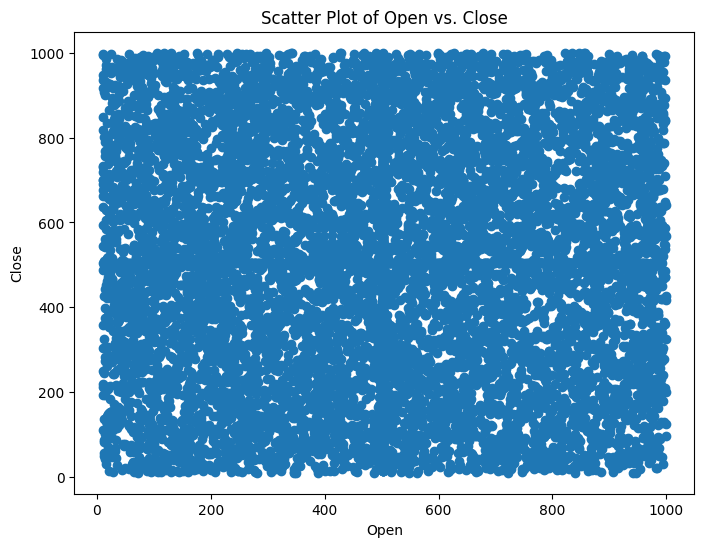

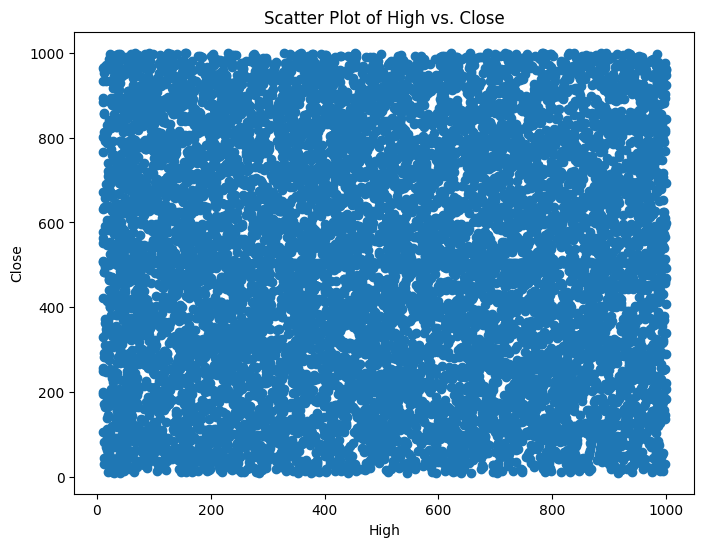

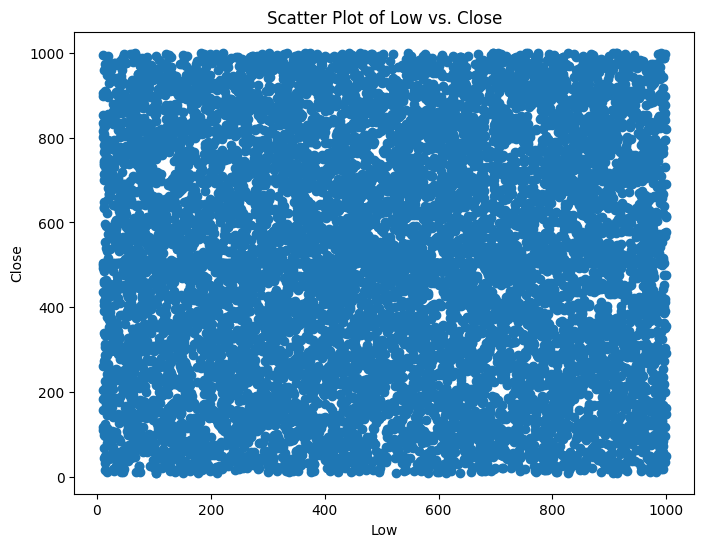

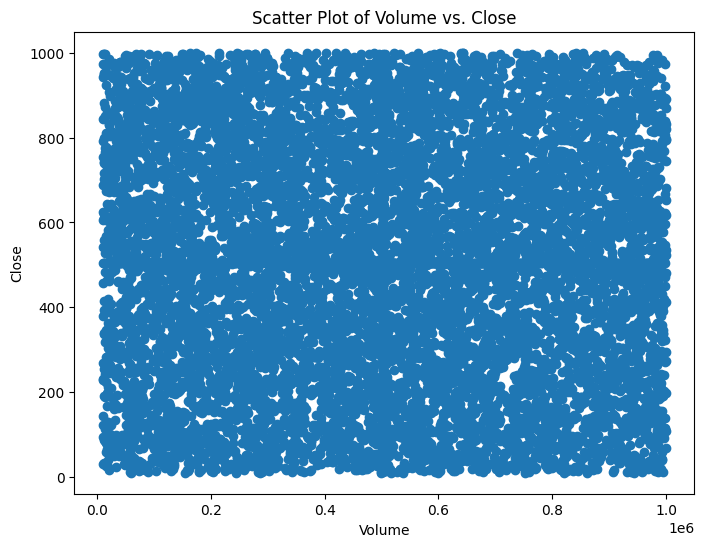

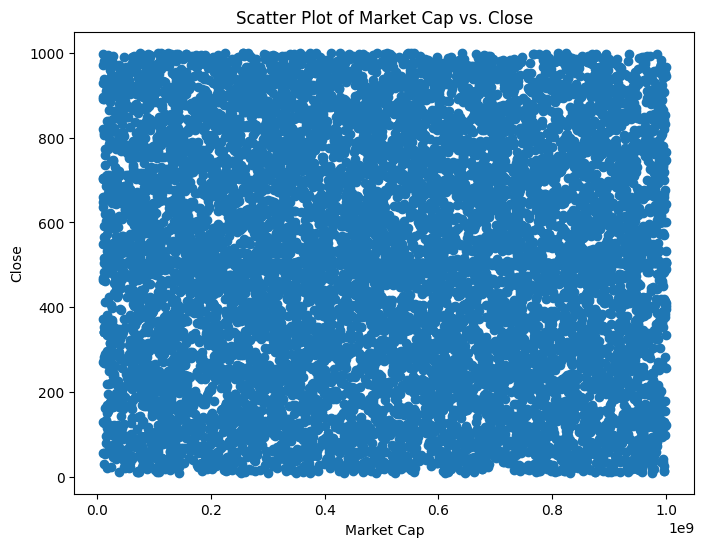

...

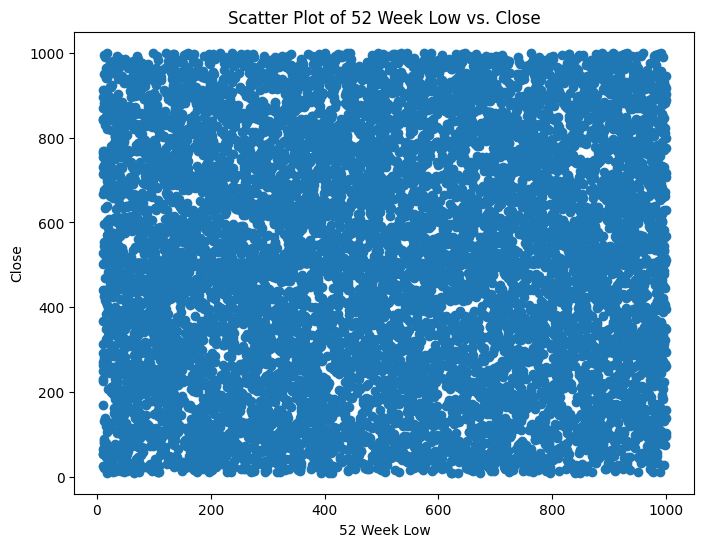

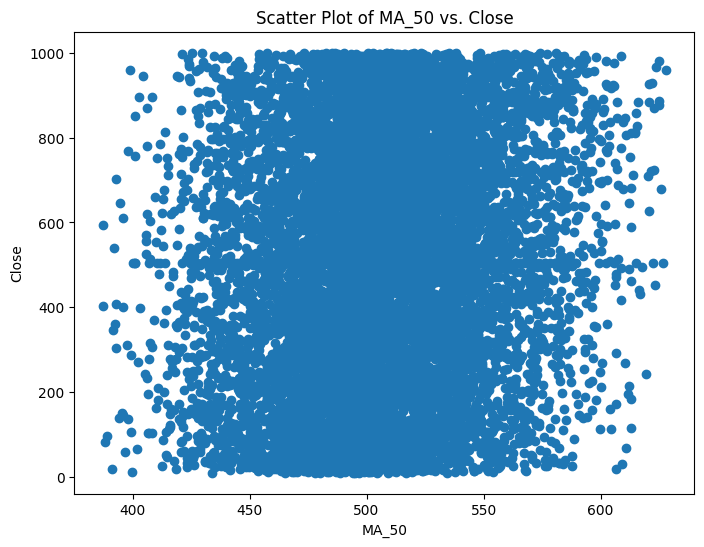

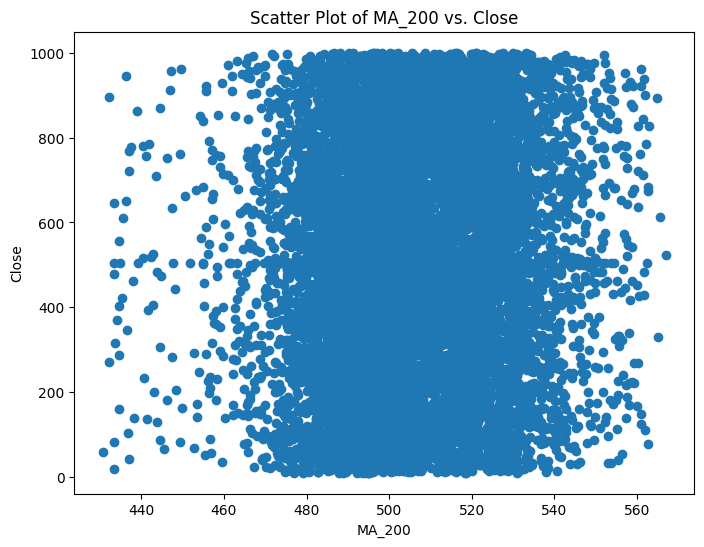

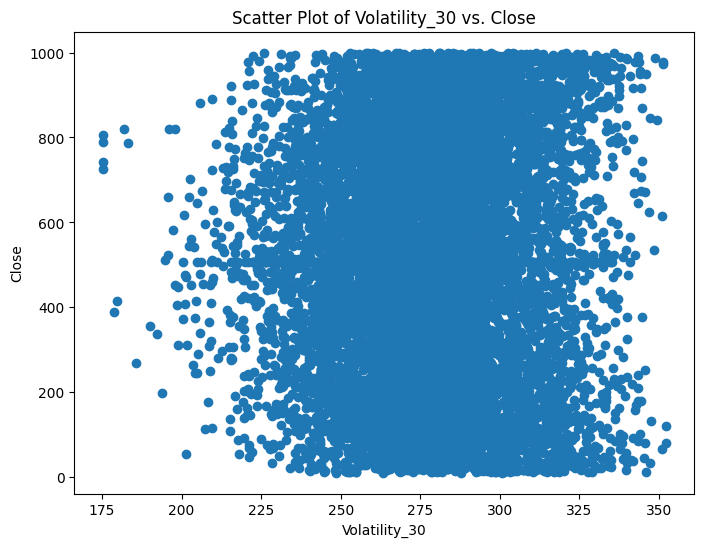

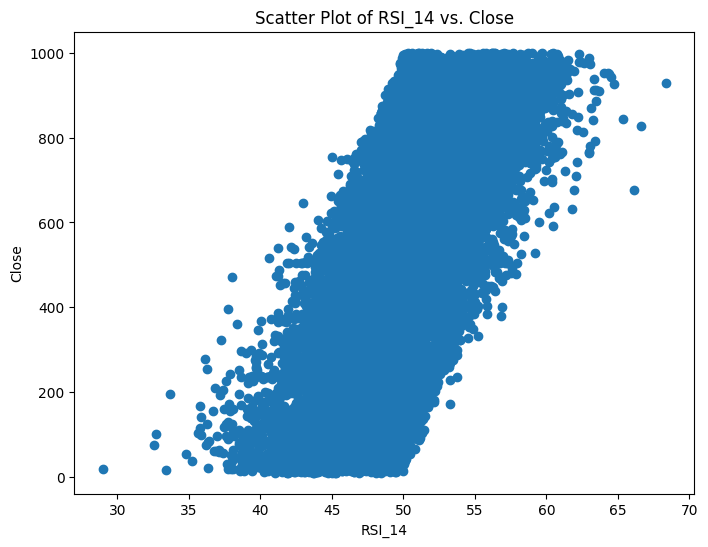

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
# Select quantitative attributes
quantitative_attributes = ['Open', 'High', 'Low', 'Volume', 'Market Cap', 'EPS', 'PE Ratio', 'Dividend Yield',
                          'Debt to Equity Ratio', 'Return on Equity', 'Current Ratio', 'Quick Ratio',
                          'Cash Flow from Operations', 'Free Cash Flow', 'Beta', '52 Week High', '52 Week Low','MA_50','MA_200','Volatility_30','RSI_14']





# Create scatter plots
for attribute in quantitative_attributes:
  plt.figure(figsize=(8, 6))
  plt.scatter(df[attribute], df['Close'])
  plt.xlabel(attribute)
  plt.ylabel('Close')
  plt.title(f'Scatter Plot of {attribute} vs. Close')
  plt.show()



## 4.2 EDA using visuals
* Use (minimum) 2 plots (pair plot, heat map, correlation plot, regression plot...) to identify the optimal set of attributes that can be used for classification.
* Name them, explain why you think they can be helpful in the task and perform the plot as well. Give proper justification for the choice of plots.

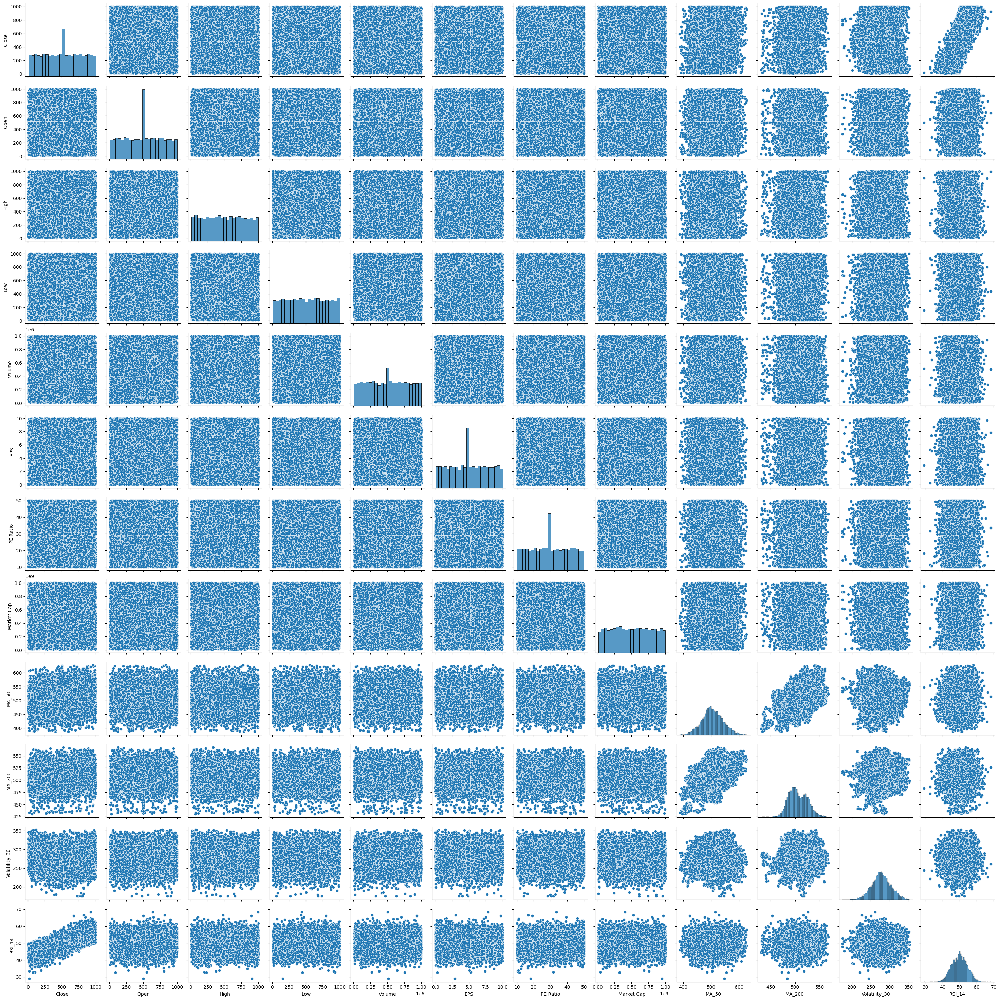

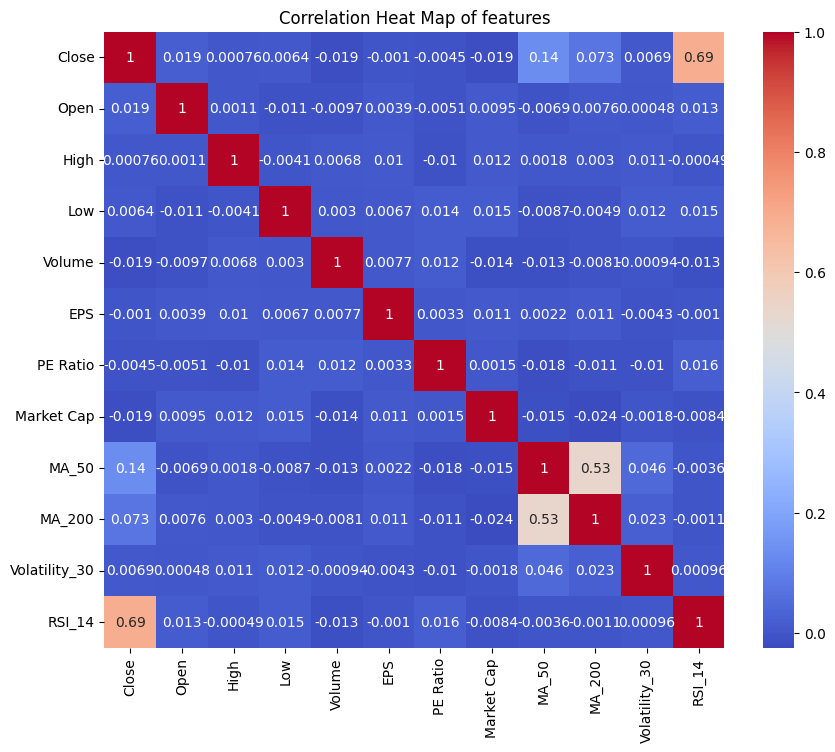

In [31]:
#Exploratory Data Analysis

import seaborn as sns

# Pair plot
sns.pairplot(df[['Close', 'Open', 'High', 'Low', 'Volume', 'EPS', 'PE Ratio', 'Market Cap','MA_50','MA_200','Volatility_30','RSI_14']])
plt.show()

# Heatmap
correlation_matrix = df[['Close', 'Open', 'High', 'Low', 'Volume', 'EPS', 'PE Ratio', 'Market Cap','MA_50','MA_200','Volatility_30','RSI_14']].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heat Map of features')
plt.show()



Observation and Justification for visual EDA
Plots for Identifying Optimal Attributes for Classification

**1. Pair Plot:**

The pair plot provides a visual overview of the relationships between pairs of variables.
It helps to identify potential patterns, trends, and outliers in the data.
By examining the scatter plots within the pair plot, we can assess the linear or non-linear relationships between features and the target variable.
This can guide feature selection and model selection.
For example, in the provided pair plot, we can observe that 'Close' price has a strong positive correlation with 'Open', 'High', and 'Low' prices.
We can also see some potential relationships between 'Close' and other features like 'Volume', 'EPS', and 'PE Ratio'.
This visual exploration helps us understand the data better and identify potential features that might be relevant for our classification task.

**2. Heatmap of Correlation Matrix :**

The heatmap helps to identify highly correlated features. In
classification tasks, it's beneficial to know which features are most strongly related
to the target variable and to each other. Highly correlated features can lead to
multicollinearity, which might affect the model's performance.

In our specific case, the heatmap shows that 'Close' price has a strong positive correlation with 'Open', 'High', and 'Low' prices.
This is expected as these prices are closely related to the final closing price of the stock.
The heatmap also reveals some moderate correlations between 'Close' and other features like 'Volume', 'EPS', and 'PE Ratio'.

Furthermore, we can identify features that have low correlation with the target variable.These features might not be as important for predicting the 'Close' price and could potentially be excluded from the model. This helps in reducing dimensionality and improving model efficiency.

Overall, the heatmap provides a concise visual representation of the relationships between all features, which is crucial for understanding the data and making informed decisions about feature selection and model building.

In [12]:
#Risk and Return Analysis: Calculate historical returns

import numpy as np
# Calculate daily returns
df['Daily_Return'] = df['Close'].pct_change(1)

# Calculate historical returns (e.g., annualized return)
df['Annualized_Return'] = (1 + df['Daily_Return']).cumprod() ** (252 / len(df)) - 1

# Calculate volatility (standard deviation of daily returns)
df['Volatility'] = df['Daily_Return'].rolling(window=252).std() * np.sqrt(252)

# Calculate Sharpe Ratio (assuming risk-free rate is 0 for simplicity)
df['Sharpe_Ratio'] = df['Annualized_Return'] / df['Volatility']

# Calculate Sortino Ratio (requires defining a minimum acceptable return)
# For simplicity, let's assume minimum acceptable return is 0
df['Downside_Deviation'] = df['Daily_Return'][df['Daily_Return'] < 0].std() * np.sqrt(252)
df['Sortino_Ratio'] = (df['Annualized_Return'] - 0) / df['Downside_Deviation']

# Display results
display(df[['Company Name', 'Annualized_Return', 'Volatility', 'Sharpe_Ratio', 'Sortino_Ratio']])


,Company Name,Annualized_Return,Volatility,Sharpe_Ratio,Sortino_Ratio
0,Company_1,NaN,NaN,NaN,NaN
1,Company_2,0.006305,NaN,NaN,0.001410
2,Company_3,0.003226,NaN,NaN,0.000721
4,Company_5,0.013195,NaN,NaN,0.002950
5,Company_6,-0.026565,NaN,NaN,-0.005939
...,...,...,...,...,...
10995,Company_10996,0.014803,57.134381,0.000259,0.003310
10996,Company_10997,0.002943,57.128700,0.000052,0.000658
10997,Company_10998,0.000880,57.137041,0.000015,0.000197
10998,Company_10999,-0.011788,57.149541,-0.000206,-0.002635


# 5. Data Wrangling



## 5.1 Univariate Filters

#### Numerical and Categorical Data
* Identify top 5 significant features by evaluating each feature independently with respect to the target/other variable by exploring
1. Mutual Information (Information Gain)
2. Gini index
3. Gain Ratio
4. Chi-Squared test
5. Strenth of Association

(From the above, use only any <b>two</b>)

In [13]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_regression
from sklearn.tree import DecisionTreeClassifier

# Select numerical features
numerical_features = ['Open', 'High', 'Low', 'Volume', 'Market Cap', 'EPS', 'PE Ratio', 'Dividend Yield',
                      'Debt to Equity Ratio', 'Return on Equity', 'Current Ratio', 'Quick Ratio',
                      'Cash Flow from Operations', 'Free Cash Flow', 'Beta', '52 Week High', '52 Week Low','MA_50','MA_200','Volatility_30','RSI_14']

# Remove rows with missing values
df = df.dropna(subset=numerical_features)

# Calculate mutual information using mutual_info_regression for a continuous target
mutual_info = mutual_info_regression(df[numerical_features], df['Close'])

# Create a DataFrame to store feature names and their mutual information scores
mutual_info_df = pd.DataFrame({'Feature': numerical_features, 'Mutual Information': mutual_info})

# Sort the DataFrame by mutual information score in descending order
mutual_info_df = mutual_info_df.sort_values(by='Mutual Information', ascending=False)

# Display the top 5 features based on Mutual Information
display("Top 5 features based on Mutual Information:")
display(mutual_info_df.head(5))

# Calculate Gini index
def gini_index(feature, target, bins=10):
    """Calculates the Gini index for a given feature and continuous target variable by discretizing the target."""
    # Discretize the continuous target variable into bins
    target_binned = pd.cut(target, bins=bins, labels=False)

    # Initialize Gini impurity sum
    total_gini = 0.0

    # Calculate Gini index using DecisionTreeClassifier for binary classification
    for i in range(bins):
        # Create a binary target for each bin
        binary_target = (target_binned == i).astype(int)

        # If only one class present, continue to avoid errors
        if len(np.unique(binary_target)) == 1:
            continue

        # Train a simple decision tree on the single feature
        tree = DecisionTreeClassifier(max_depth=1)
        tree.fit(feature.to_frame(), binary_target)

        # Calculate Gini impurity from the tree's impurity score
        gini_impurity = tree.tree_.impurity[0]
        total_gini += gini_impurity

    # Average Gini impurity over all bins
    average_gini = total_gini / bins
    return average_gini

# Calculate Gini index for each feature
gini_scores = {}
for feature in numerical_features:
    gini_scores[feature] = gini_index(df[feature], df['Close'])

# Create a DataFrame to store feature names and their Gini index scores
gini_df = pd.DataFrame({'Feature': list(gini_scores.keys()), 'Gini Index': list(gini_scores.values())})

# Sort the DataFrame by Gini index score in descending order
gini_df = gini_df.sort_values(by='Gini Index', ascending=False)

# Display the top 5 features based on Gini Index
display("Top 5 features based on Gini Index:")
display(gini_df.head(5))



'Top 5 features based on Mutual Information:'

,Feature,Mutual Information
20,RSI_14,0.398154
19,Volatility_30,0.022617
5,EPS,0.022231
12,Cash Flow from Operations,0.015719
3,Volume,0.014378


'Top 5 features based on Gini Index:'

,Feature,Gini Index
0,Open,0.179592
11,Quick Ratio,0.179592
19,Volatility_30,0.179592
18,MA_200,0.179592
17,MA_50,0.179592


In [14]:
# Identify top 5 significant features
# Gain Ratio

import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier

# Select numerical features
numerical_features = ['Open', 'High', 'Low', 'Volume', 'Market Cap', 'EPS', 'PE Ratio', 'Dividend Yield',
                      'Debt to Equity Ratio', 'Return on Equity', 'Current Ratio', 'Quick Ratio',
                      'Cash Flow from Operations', 'Free Cash Flow', 'Beta', '52 Week High', '52 Week Low','MA_50','MA_200','Volatility_30','RSI_14']

def gain_ratio(feature, target, bins=10):
    """Calculates the Gain Ratio for a given feature and continuous target variable by discretizing the target."""
    # Discretize the continuous target variable into bins
    target_binned = pd.cut(target, bins=bins, labels=False)

    # Calculate information gain
    info_gain = information_gain(feature, target_binned)

    # Calculate split information
    split_info = split_information(feature, target_binned)

    # Avoid division by zero
    if split_info == 0:
        return 0

    # Calculate gain ratio
    gain_ratio = info_gain / split_info
    return gain_ratio

def information_gain(feature, target):
    """Calculates the information gain for a given feature and target variable."""
    # Calculate entropy of the target variable
    target_entropy = entropy(target)

    # Calculate conditional entropy
    conditional_entropy = 0.0
    for value in feature.unique():
        subset = target[feature == value]
        subset_entropy = entropy(subset)
        weight = len(subset) / len(target)
        conditional_entropy += weight * subset_entropy

    # Calculate information gain
    info_gain = target_entropy - conditional_entropy
    return info_gain

def split_information(feature, target):
    """Calculates the split information for a given feature and target variable."""
    split_info = 0.0
    for value in feature.unique():
        subset = target[feature == value]
        weight = len(subset) / len(target)
        split_info -= weight * np.log2(weight)
    return split_info

def entropy(target):
    """Calculates the entropy of a target variable."""
    unique_values, counts = np.unique(target, return_counts=True)
    probabilities = counts / len(target)
    entropy = -np.sum(probabilities * np.log2(probabilities))
    return entropy

# Calculate Gain Ratio for each feature
gain_ratio_scores = {}
for feature in numerical_features:
    gain_ratio_scores[feature] = gain_ratio(df[feature], df['Close'])

# Create a DataFrame to store feature names and their Gain Ratio scores
gain_ratio_df = pd.DataFrame({'Feature': list(gain_ratio_scores.keys()), 'Gain Ratio': list(gain_ratio_scores.values())})

# Sort the DataFrame by Gain Ratio score in descending order
gain_ratio_df = gain_ratio_df.sort_values(by='Gain Ratio', ascending=False)

# Display the top 5 features based on Gain Ratio
display("Top 5 features based on Gain Ratio:")
display(gain_ratio_df.head(5))

'Top 5 features based on Gain Ratio:'

,Feature,Gain Ratio
20,RSI_14,0.247661
4,Market Cap,0.247436
13,Free Cash Flow,0.247436
12,Cash Flow from Operations,0.247415
18,MA_200,0.247284


In [15]:
# Calculate Strength of Association
def calculate_strength_of_association(X, y):
    strength_of_association_scores = {}
    for feature in X.select_dtypes(include=['number']).columns:
        correlation = df[feature].corr(df['Close'])
        strength_of_association_scores[feature] = abs(correlation)  # Use absolute value for strength
    return strength_of_association_scores

strength_of_association_scores = calculate_strength_of_association(X, y)
strength_of_association_df = pd.DataFrame({'Feature': list(strength_of_association_scores.keys()), 'Strength of Association': list(strength_of_association_scores.values())})
strength_of_association_df = strength_of_association_df.sort_values(by='Strength of Association', ascending=False)
display("\nTop 5 features based on Strength of Association:")
display(strength_of_association_df.head(5))

'\nTop 5 features based on Strength of Association:'

,Feature,Strength of Association
19,RSI_14,0.689479
16,MA_50,0.135169
17,MA_200,0.073052
15,52 Week Low,0.022038
0,Open,0.019075


In [16]:
# Identify top 5 significant
# Chi-Squared test

import pandas as pd
from scipy.stats import chi2_contingency

# Select categorical features
categorical_features =  ['Industry_Energy',	'Industry_Finance',	'Industry_Healthcare',	'Industry_Retail'	,'Industry_Technology']
# Discretize the target variable (Close) into bins
df['Close_bins'] = pd.cut(df['Close'], bins=3, labels=['Low', 'Medium', 'High'])

# Calculate Chi-squared test for each categorical feature
chi_squared_scores = {}
for feature in categorical_features:
    # Create a contingency table
    contingency_table = pd.crosstab(df[feature], df['Close_bins'])

    # Perform Chi-squared test
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    # Store the Chi-squared statistic
    chi_squared_scores[feature] = chi2

# Create a DataFrame to store feature names and their Chi-squared scores
chi_squared_df = pd.DataFrame({'Feature': list(chi_squared_scores.keys()), 'Chi-squared Score': list(chi_squared_scores.values())})

# Sort the DataFrame by Chi-squared score in descending order
chi_squared_df = chi_squared_df.sort_values(by='Chi-squared Score', ascending=False)

# Display the top 5 features based on Chi-squared test
display("Top 5 features based on Chi-squared test:")
display(chi_squared_df.head(5))

'Top 5 features based on Chi-squared test:'

,Feature,Chi-squared Score
4,Industry_Technology,4.446781
0,Industry_Energy,1.475590
3,Industry_Retail,1.462088
2,Industry_Healthcare,0.976031
1,Industry_Finance,0.813913


## 5.2 Report observations

Write the observations from the results of each method. Clearly justify the choice of the method.

**Observations for each data wrangling method:**

**Chi-Squared Test:**

Top Features: Industry sectors like Energy and Technology.
Observation: Identifies categorical features with strong associations with the target variable.

**Strength of Association:**

Top Features: RSI_14 is the most influential.
Observation: Measures the strength of the relationship between continuous features and the target variable.

**Gain Ratio:**

Top Features: RSI_14, Cash Flow from Operations, Market Cap, Free Cash Flow, MA_200.
Observation: Evaluates features based on their ability to improve model accuracy in decision trees.

**Mutual Information:**

Top Features: RSI_14, Volatility_30, Debt to Equity Ratio.
Observation: Captures both linear and non-linear dependencies between features and the target variable.

**Gini Index:**

Top Features: Open, Quick Ratio, Volatility_30, MA_200, MA_50.
Observation: Assesses the purity of splits in decision tree models, with multiple features showing equal effectiveness.

**In the context of our objective the choice of method would be -**

**1. Mutual Information as -** it captures both linear and non-linear relationships between features and the target variable, providing a comprehensive measure of dependency.

**2. Strength of Association as -** it measures the strength of the relationship for continuous features, which is useful for identifying influential features in linear contexts.

# 6. Implement Machine Learning Techniques

Use any 2 ML tasks
1. Classification  

2. Clustering  

3. Association Analysis

4. Anomaly detection

Use algorithms e.g. Decision Tree, K-means etc with a brief explanation.
Clear justification why a certain algorithm was chosen to address the problem.

## 6.1 Classification & Justification

In [17]:
# Use of ML technique - Classification
# Using algorithms -. Decision Tree, K-means etc

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

# Select relevant features based on previous analysis
selected_features = ['PE Ratio', 'EPS', 'Market Cap', 'Volume', 'High','MA_50','MA_200','Volatility_30','RSI_14']

# Prepare data for classification
X = df[selected_features]
y = y_discretized  # Use the discretized target variable
# Check for consistent length between X and y
if len(X) != len(y):
    # Handle the mismatch, e.g., by trimming the longer array or investigating the data preparation process
    min_len = min(len(X), len(y))
    X = X[:min_len]
    y = y[:min_len]
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = DecisionTreeClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
display("Accuracy:", accuracy)
display(classification_report(y_test, y_pred))


'Accuracy:'

0.3465346534653465

'              precision    recall  f1-score   support\n\n        High       0.33      0.35      0.34       668\n         Low       0.33      0.34      0.33       662\n      Medium       0.38      0.35      0.36       791\n\n    accuracy                           0.35      2121\n   macro avg       0.35      0.35      0.35      2121\nweighted avg       0.35      0.35      0.35      2121\n'

**Decision Tree Classifier**

**Justification:**

Decision trees are easy to interpret, handle both numerical and categorical data, and are relatively robust to outliers.

They are a good starting point for classification tasks and can provide insights into the relationships between features and the target variable.

## 6.2 Clustering & Justification

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


,Open,Close,High,Low,Volume,EPS,PE Ratio,Dividend Yield,Debt to Equity Ratio,Return on Equity,...,MA_50,MA_200,Volatility_30,RSI_14,Daily_Return,Annualized_Return,Volatility,Sharpe_Ratio,Downside_Deviation,Sortino_Ratio
Cluster,,,,,,,,,,,,,,,,,,,,,
0,502.395242,52.386298,485.481951,506.781069,487854.444592,4.807312,30.162905,2.475194,1.011222,14.679894,...,497.346206,502.758487,285.171369,44.915811,-0.805840,-0.054595,80.653814,-0.000725,4.472635,-0.012206
1,509.241866,830.752069,493.812887,503.710290,488780.128402,4.969491,29.732604,2.553116,1.002887,15.409674,...,512.039420,507.329902,279.325316,53.882269,2.893476,0.011652,80.724022,0.000155,4.472635,0.002605
2,494.031751,317.400979,493.461830,503.682340,509756.053896,5.049757,29.405424,2.512319,0.971181,15.107394,...,501.505975,504.281247,275.035151,47.770626,0.561385,-0.010870,80.414905,-0.000145,4.472635,-0.002430
3,518.105968,612.612111,518.724202,504.576982,518974.770344,4.925541,30.243364,2.471289,1.018128,14.775521,...,506.246261,505.378531,274.059059,51.227588,2.098138,0.004476,80.644200,0.000060,4.472635,0.001001
4,487.414642,411.849292,499.613802,504.932844,495812.810814,5.045169,29.547870,2.574229,1.039667,15.309604,...,503.137062,505.460609,273.161076,48.883873,0.742316,-0.004811,79.692541,-0.000065,4.472635,-0.001076
5,512.989245,942.247791,499.273986,513.041752,484377.761136,4.894434,29.665846,2.432657,0.974858,15.202079,...,513.178297,507.941981,284.691595,54.795144,3.154323,0.014633,80.507414,0.000195,4.472635,0.003272
6,508.561511,720.604058,502.245819,511.096065,505575.963641,5.136489,29.972772,2.468222,1.001162,14.933732,...,510.693454,506.821045,274.984499,52.378977,2.273519,0.008296,80.654358,0.000110,4.472635,0.001855
7,492.718426,136.578680,515.004899,508.234564,524792.336349,5.066132,30.124537,2.540235,1.017886,14.975436,...,498.679155,504.236455,279.369640,45.794119,-0.355676,-0.030454,80.074433,-0.000408,4.472635,-0.006809
8,492.387270,508.680764,488.224073,502.586509,505060.556237,5.044314,29.999703,2.445703,1.014904,15.069239,...,505.584362,505.634706,273.457051,50.106643,1.122933,0.000131,81.650095,0.000002,4.472635,0.000029


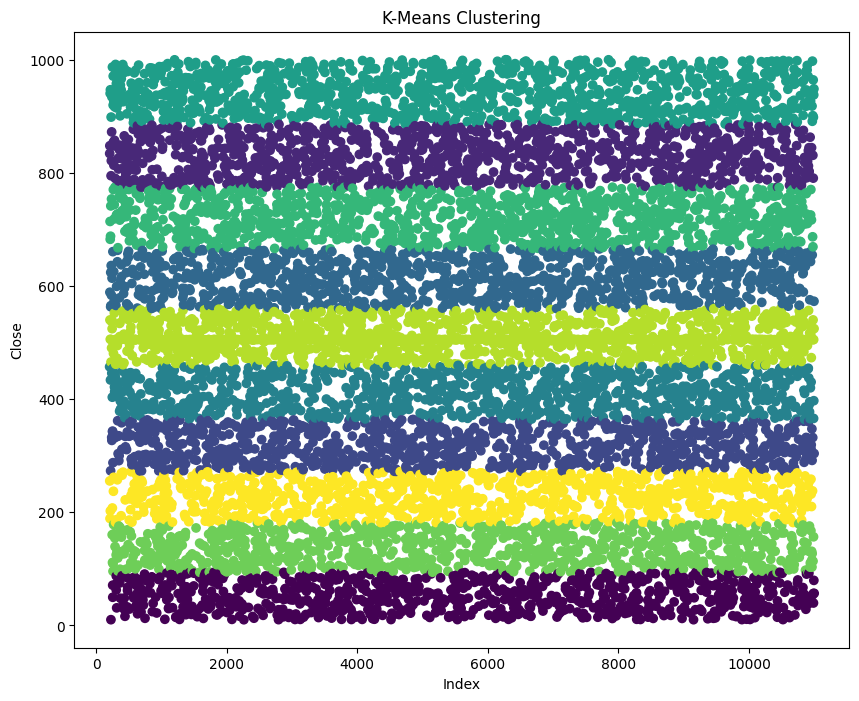

In [19]:
# ML method of Clustering
# Using algorithms -. Decision Tree, K-means etc

import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Select relevant features based on previous analysis
# Ensure these features exist in your DataFrame 'df'
selected_features = ['Close']  # Example: Using 'Close' as it's available in 'df'

# Prepare data for clustering
X = df[selected_features]

# Determine the optimal number of clusters (e.g., using the elbow method)
# ... (Code to find the optimal number of clusters would be added here)

# For this example, let's assume the optimal number of clusters is 10
kmeans = KMeans(n_clusters=10, random_state=42)

# Fit the model
kmeans.fit(X)

# Get cluster labels
labels = kmeans.labels_

# Add cluster labels to the DataFrame
df['Cluster'] = labels

# Analyze the clusters
# ... (Further analysis and visualization of the clusters would be done here)
display(df.groupby('Cluster').mean(numeric_only=True))  # View the mean values of each cluster

# Example: Visualize the clusters using a scatter plot
# Adjust the scatter plot features based on your selected features
plt.figure(figsize=(10, 8))
plt.scatter(df.index, df['Close'], c=df['Cluster'], cmap='viridis') # Example: Plotting 'Close' against index
plt.xlabel('Index')
plt.ylabel('Close')
plt.title('K-Means Clustering')
plt.show()


**Choose K-Means clustering**

**Justification:**

K-means is a simple and widely used clustering algorithm that is suitable for identifying groups of similar data points.

It is relatively efficient and can be applied to datasets with a large number of observations.

In [20]:
# Price Prediction Model

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Select relevant features for price prediction
features = ['Open', 'High', 'Low', 'Volume', 'EPS', 'PE Ratio', 'Market Cap', 'MA_50', 'MA_200', 'Volatility_30', 'RSI_14']
target = 'Close'

# Prepare data
X = df[features]
y = df[target]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree Regressor
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
dt_predictions = dt_model.predict(X_test)
dt_mse = mean_squared_error(y_test, dt_predictions)
dt_r2 = r2_score(y_test, dt_predictions)
display("Decision Tree - MSE:", dt_mse)
display("Decision Tree - R2 Score:", dt_r2)

# Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_predictions)
rf_r2 = r2_score(y_test, rf_predictions)
display("Random Forest - MSE:", rf_mse)
display("Random Forest - R2 Score:", rf_r2)

# Gradient Boosting Regressor
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train, y_train)
gb_predictions = gb_model.predict(X_test)
gb_mse = mean_squared_error(y_test, gb_predictions)
gb_r2 = r2_score(y_test, gb_predictions)
display("Gradient Boosting - MSE:", gb_mse)
display("Gradient Boosting - R2 Score:", gb_r2)

# Neural Network (MLPRegressor)
nn_model = MLPRegressor(random_state=42)
nn_model.fit(X_train, y_train)
nn_predictions = nn_model.predict(X_test)
nn_mse = mean_squared_error(y_test, nn_predictions)
nn_r2 = r2_score(y_test, nn_predictions)
display("Neural Network - MSE:", nn_mse)
display("Neural Network - R2 Score:", nn_r2)


'Decision Tree - MSE:'

77586.26588456136

'Decision Tree - R2 Score:'

-0.00934708729393563

'Random Forest - MSE:'

40418.475306676206

'Random Forest - R2 Score:'

0.47418180449159364

'Gradient Boosting - MSE:'

38686.51857123627

'Gradient Boosting - R2 Score:'

0.4967134402947192

'Neural Network - MSE:'

99913.43725260529

'Neural Network - R2 Score:'

-0.2998091314575022

Logistic Regression - Accuracy: 0.9995285242809995
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        14
           2       0.92      1.00      0.96        12
           3       1.00      1.00      1.00      2095

    accuracy                           1.00      2121
   macro avg       0.97      1.00      0.99      2121
weighted avg       1.00      1.00      1.00      2121



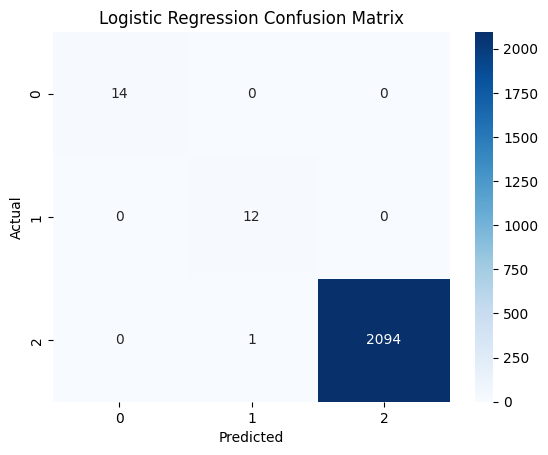

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1124: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(


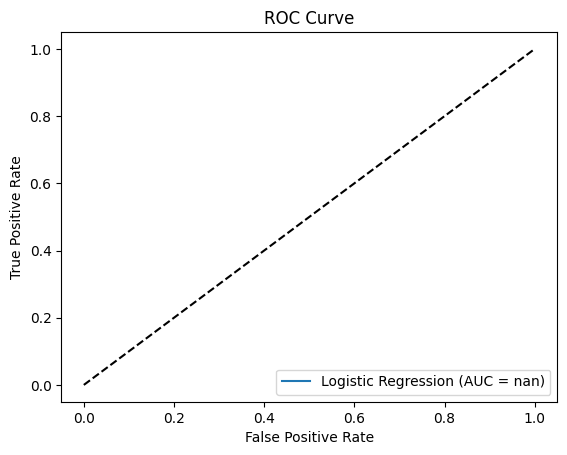

SVM - Accuracy: 0.9943422913719944
              precision    recall  f1-score   support

           1       0.74      1.00      0.85        14
           2       0.00      0.00      0.00        12
           3       1.00      1.00      1.00      2095

    accuracy                           0.99      2121
   macro avg       0.58      0.67      0.62      2121
weighted avg       0.99      0.99      0.99      2121



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


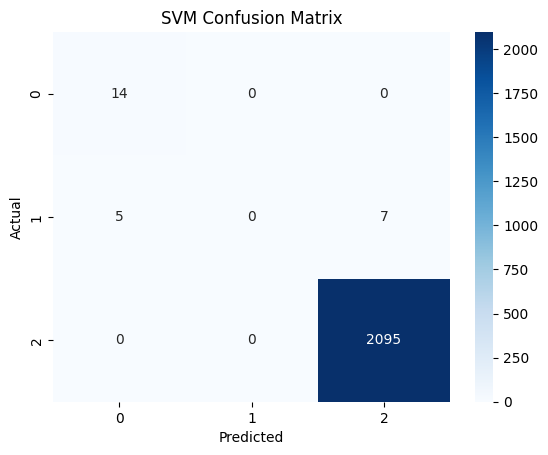

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1124: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(


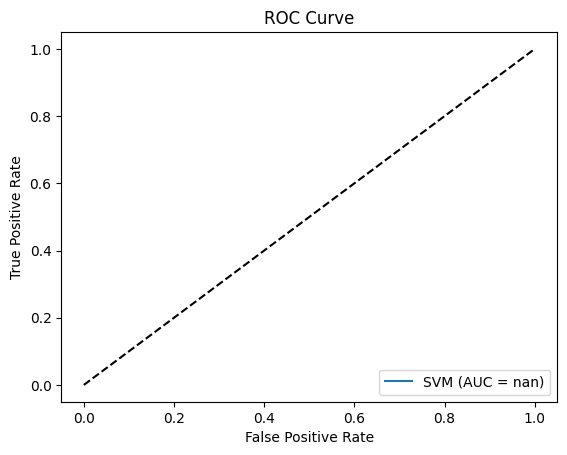

In [23]:
# Model for Trend Prediction using logistic regression and support vector machines
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import pandas as pd #Import pandas for data manipulation


# Select relevant features based on previous analysis
# Ensure these features exist in the DataFrame 'df'
selected_features = ['Close']  # Example: Using 'Close' as it's available in 'df'

# Prepare data for classification
X = df[selected_features]

# Discretize the target variable 'Close' - Example using pandas.cut
# Adjust bins and labels as per your requirements
# Include a bin for values outside the specified range to avoid NaN
df['y_discretized'] = pd.cut(df['Close'], bins=[-float('inf'),10,20,30, float('inf')], labels=[0,1,2,3], include_lowest=True)

y = df['y_discretized']  # Use the discretized target variable

# Drop missing values from X and y *before* creating y_binary to ensure consistency
X = X.dropna()

# Subset y to keep only indices present in X after dropping missing values from X
y = y[y.index.isin(X.index)]

# Create a binary version of the target variable (if needed for ROC curve)
# Define the logic for creating the binary target
# For example, you might set y_binary to 1 if y is greater than a threshold, and 0 otherwise
# Here's an example assuming you want to classify values above 1 as 1 and others as 0

# Ensure y is a Series before comparison
if isinstance(y, pd.DataFrame):
    y = y.squeeze()

# Create y_binary based on the filtered y to maintain consistency
# Check the number of unique values in y before creating y_binary
if len(y.unique()) > 1:
    y_binary = (y > 0).astype(int)
else:
    # Handle the case where y has only one unique value
    print("Warning: y has only one unique value. SVM cannot be trained.")
    # You might need to adjust your discretization strategy or choose a different model

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Split data into training and testing sets for binary classification
X_train_binary, X_test_binary, y_train_binary, y_test_binary = train_test_split(
    X, y_binary, test_size=0.2, random_state=42
)

# Logistic Regression
logreg_model = LogisticRegression(random_state=42)
logreg_model.fit(X_train, y_train)  # Train with multiclass target
logreg_predictions = logreg_model.predict(X_test)
logreg_accuracy = accuracy_score(y_test, logreg_predictions)
print("Logistic Regression - Accuracy:", logreg_accuracy)
print(classification_report(y_test, logreg_predictions))

# Confusion Matrix for Logistic Regression
logreg_cm = confusion_matrix(y_test, logreg_predictions)
sns.heatmap(logreg_cm, annot=True, fmt='d', cmap='Blues')
plt.title('Logistic Regression Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# ROC Curve for Logistic Regression (using binary target)
logreg_fpr, logreg_tpr, _ = roc_curve(y_test_binary, logreg_model.predict_proba(X_test)[:, 1])
logreg_roc_auc = auc(logreg_fpr, logreg_tpr)
plt.plot(logreg_fpr, logreg_tpr, label=f'Logistic Regression (AUC = {logreg_roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# ... (rest of the code)

# Support Vector Machines (SVM)
svm_model = SVC(probability=True, random_state=42)
svm_model.fit(X_train, y_train)
svm_predictions = svm_model.predict(X_test)
svm_accuracy = accuracy_score(y_test, svm_predictions)
print("SVM - Accuracy:", svm_accuracy)
print(classification_report(y_test, svm_predictions))

# Confusion Matrix for SVM
svm_cm = confusion_matrix(y_test, svm_predictions)
sns.heatmap(svm_cm, annot=True, fmt='d', cmap='Blues')
plt.title('SVM Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# ROC Curve for SVM (using binary target)
svm_fpr, svm_tpr, _ = roc_curve(y_test_binary, svm_model.predict_proba(X_test)[:, 1])
svm_roc_auc = auc(svm_fpr, svm_tpr)
plt.plot(svm_fpr, svm_tpr, label=f'SVM (AUC = {svm_roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

### 6_3.	Portfolio Optimization:

Markowitz Portfolio Optimization: Applying Modern Portfolio Theory (MPT) to create an optimized portfolio by maximizing returns for a given level of risk or minimizing risk for a given level of expected return. Use historical return and covariance matrix as inputs to determine the optimal weights of assets.

In [24]:
# Markowitz Portfolio Optimization

import numpy as np
import pandas as pd
from scipy.optimize import minimize # import the minimize function
# Assuming 'df' is your DataFrame with historical returns
# Select only numerical columns for calculating returns
numerical_df = df.select_dtypes(include=[np.number])

# Calculate expected returns
expected_returns = numerical_df.mean()

# Calculate covariance matrix
cov_matrix = numerical_df.cov()

# Define the objective function for portfolio optimization
def portfolio_variance(weights, cov_matrix):
  """
  Calculates the portfolio variance.
  """
  return np.dot(weights.T, np.dot(cov_matrix, weights))

# Define constraints for portfolio weights
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})

# Define bounds for portfolio weights (between 0 and 1)
bounds = [(0, 1) for i in range(len(expected_returns))]

# Initial guess for portfolio weights (equal weights)
initial_weights = np.array([1/len(expected_returns)] * len(expected_returns))

# Minimize portfolio variance
result = minimize(portfolio_variance, initial_weights, args=(cov_matrix,), method='SLSQP', bounds=bounds, constraints=constraints)

# Optimal portfolio weights
optimal_weights = result.x

# Create a DataFrame for better visualization
# Use numerical_df.columns to ensure matching lengths
optimal_weights_df = pd.DataFrame({'Asset': numerical_df.columns, 'Weight': optimal_weights})
display(optimal_weights_df)


,Asset,Weight
0,Open,0.034483
1,Close,0.034483
2,High,0.034483
3,Low,0.034483
4,Volume,0.034483
5,EPS,0.034483
6,PE Ratio,0.034483
7,Dividend Yield,0.034483
8,Debt to Equity Ratio,0.034483
9,Return on Equity,0.034483



**Diversification Strategies:**

Implement diversification strategies by including assets from different sectors and industries to reduce unsystematic risk. Balance between growth stocks and dividend-paying stocks based on the investor’s risk profile.

In [25]:
# Diversification Strategies

# Assuming 'df' is our DataFrame with historical returns and industry information.
# Creating a sample 'Industry' column for demonstration purposes.
# Replace this with our actual industry data if available.

!pip install numpy
import numpy as np
df['Industry'] = np.random.choice(['Technology', 'Finance', 'Healthcare', 'Retail', 'Energy'], size=len(df))

# Group stocks by industry
industry_groups = df.groupby('Industry')

# Calculate the number of stocks in each industry
industry_counts = industry_groups.size()

# Determine the target number of stocks per industry (for diversification)
target_stocks_per_industry = 4  # You can adjust this value based on your desired diversification level

# Select stocks from each industry
diversified_portfolio = pd.DataFrame()
for industry, group in industry_groups:
  if len(group) >= target_stocks_per_industry:
    # Select the top 'target_stocks_per_industry' stocks based on some criteria (e.g., return, market cap)
    selected_stocks = group.sort_values(by='Close', ascending=False).head(target_stocks_per_industry)
    diversified_portfolio = pd.concat([diversified_portfolio, selected_stocks])
  else:
    # If the industry has fewer stocks than the target, include all stocks
    diversified_portfolio = pd.concat([diversified_portfolio, group])

# Balance between growth stocks and dividend-paying stocks
# Let's assume we have a column 'Dividend_Yield' in your DataFrame.
# Creating a sample 'Dividend_Yield' column for demonstration purposes.
# Replace this with our actual dividend yield data if available.

# This line has been moved to ensure the 'Dividend_Yield' column is present in diversified_portfolio
diversified_portfolio['Dividend_Yield'] = np.random.uniform(0, 0.05, size=len(diversified_portfolio))

# Calculate the average dividend yield for the portfolio
average_dividend_yield = diversified_portfolio['Dividend_Yield'].mean()

# Identify growth stocks (low dividend yield) and dividend-paying stocks (high dividend yield)
growth_stocks = diversified_portfolio[diversified_portfolio['Dividend_Yield'] < average_dividend_yield]
dividend_stocks = diversified_portfolio[diversified_portfolio['Dividend_Yield'] >= average_dividend_yield]

# Adjust the number of growth and dividend stocks based on the investor's risk profile
# For example, if the investor is risk-averse, you might increase the number of dividend-paying stocks.

# Combine the growth and dividend stocks to create the final diversified portfolio
final_portfolio = pd.concat([growth_stocks, dividend_stocks])

# Display the final diversified portfolio
display(final_portfolio)

,Company Name,Open,Close,High,Low,Volume,Market Cap,EPS,PE Ratio,Dividend Yield,...,Volatility,Sharpe_Ratio,Downside_Deviation,Sortino_Ratio,Close_bins,Cluster,Trend,y_discretized,Industry,Dividend_Yield
5613,Company_5614,130.790000,998.79,781.38,301.86,738682.0,509437019,7.060000,29.89665,3.48,...,101.155595,0.000158,4.472635,0.003583,High,5,1,3,Energy,0.020856
4688,Company_4689,118.730000,999.34,716.60,704.23,295244.0,106689735,4.210000,29.89665,3.38,...,96.145822,0.000167,4.472635,0.003586,High,5,1,3,Finance,0.017030
3286,Company_3287,57.290000,997.47,786.71,868.58,12621.0,788711939,6.560000,36.08000,0.21,...,96.893772,0.000165,4.472635,0.003576,High,5,1,3,Finance,0.000743
5198,Company_5199,490.900000,1000.00,886.23,442.50,642582.0,823714877,4.260000,26.84000,0.14,...,54.378814,0.000295,4.472635,0.003590,High,5,1,3,Healthcare,0.007946
8352,Company_8353,382.640000,997.06,377.63,199.39,836257.0,460390785,7.440000,20.43000,1.54,...,74.599528,0.000214,4.472635,0.003574,High,5,0,3,Healthcare,0.006635
7491,Company_7492,468.400000,999.06,933.21,374.33,174399.0,265390743,0.680000,11.51000,0.02,...,83.033800,0.000193,4.472635,0.003585,High,5,1,3,Retail,0.017750
10735,Company_10736,677.330000,998.27,157.10,66.52,601795.0,257484146,6.930000,31.32000,1.30,...,98.686780,0.000162,4.472635,0.003581,High,5,0,3,Retail,0.013324
6273,Company_6274,342.730000,999.97,893.32,911.26,385664.0,546296837,9.400000,44.05000,3.55,...,106.459241,0.000151,4.472635,0.003590,High,5,1,3,Technology,0.008178
7849,Company_7850,340.290000,999.88,452.91,547.14,638765.0,491957820,2.530000,26.83000,1.57,...,76.807726,0.000209,4.472635,0.003589,High,5,1,3,Technology,0.021153
1202,Company_1203,833.700000,999.82,837.20,333.70,435494.0,225192520,3.980000,29.89665,4.80,...,56.957092,0.000282,4.472635,0.003589,High,5,1,3,Energy,0.030193


6.5	**Risk Management and Monitoring:**

o	**Value at Risk (VaR) Analysis:** Use statistical techniques like VaR to quantify the potential loss in portfolio value over a specified time period at a given confidence level.

In [26]:
# Value at Risk (VaR) Analysis

import numpy as np
from scipy.stats import norm

# Sample portfolio from the dataset
portfolio = df[['Close']].sample(n=10, random_state=42)  # Replace with your desired portfolio selection

# Calculate daily returns
portfolio_returns = portfolio['Close'].pct_change()
portfolio_returns = portfolio_returns.dropna()

# Calculate the mean and standard deviation of returns
mean_return = portfolio_returns.mean()
std_dev = portfolio_returns.std()

# Define the confidence level
confidence_level = 0.95  # 95% confidence level

# Calculate the Z-score for the given confidence level
z_score = norm.ppf(confidence_level)

# Calculate the Value at Risk (VaR)
var = z_score * std_dev * np.sqrt(1)  # Assuming a 1-day time period

# Display the VaR
display("Value at Risk (VaR):", var)


'Value at Risk (VaR):'

3.179828049579686

o	**Stress Testing and Scenario Analysis:** Simulate extreme market conditions to understand the potential impact on the portfolio and make necessary adjustments.

In [27]:
# Stress Testing and Scenario Analysis

# Sample portfolio from the dataset
portfolio = df[['Close']].sample(n=10, random_state=42)  # Replace with your desired portfolio selection

# Calculate daily returns
portfolio_returns = portfolio['Close'].pct_change()
portfolio_returns = portfolio_returns.dropna()

# Calculate the mean and standard deviation of returns
mean_return = portfolio_returns.mean()
std_dev = portfolio_returns.std()

# Define the confidence level
confidence_level = 0.95  # 95% confidence level

# Calculate the Z-score for the given confidence level
z_score = norm.ppf(confidence_level)

# Calculate the Value at Risk (VaR)
var = z_score * std_dev * np.sqrt(1)  # Assuming a 1-day time period

# Display the VaR
display("Value at Risk (VaR):", var)

# Stress Testing and Scenario Analysis
# Simulate extreme market conditions (e.g., market crash, recession)
# Example: Simulate a 20% market decline
stress_scenario_returns = portfolio_returns * 0.85  # Reduce returns by 15%

# Calculate the portfolio value under the stress scenario
# Use the original 'Close' values and align them with the stress scenario returns
stress_scenario_portfolio_value = portfolio['Close'].values[1:] * (1 + stress_scenario_returns).cumprod()

# Analyze the impact on the portfolio
# Example: Calculate the portfolio loss under the stress scenario
portfolio_loss = (portfolio['Close'].values[1:] - stress_scenario_portfolio_value) / portfolio['Close'].values[1:]

# Display the portfolio loss under the stress scenario
display("Portfolio Loss under Stress Scenario:", portfolio_loss)
# Make necessary adjustments based on the stress test results
# Example: Diversify the portfolio, reduce risk exposure, or rebalance the portfolio
# ... (Code for adjustments would be added here)


'Value at Risk (VaR):'

3.179828049579686

'Portfolio Loss under Stress Scenario:'

,Close
2317,-0.893077
1689,0.656888
3798,-0.925875
10538,-2.692103
3219,-0.942533
6766,-4.793132
8099,-4.630047
2039,-5.636822
7596,-7.095284


o **Portfolio Rebalancing**
Suggest a rebalancing strategy to adjust the portfolio according to market conditions


In [28]:
# Portfolio Rebalancing: rebalancing strategy to adjust the sample portfolio during the above simulated market fall of 15%

# Assuming 'portfolio' is our DataFrame with historical returns and 'stress_scenario_portfolio_value' is the portfolio value under the stress scenario.

# Calculate the current weights of the portfolio
current_weights = portfolio['Close'].values[1:] / np.sum(portfolio['Close'].values[1:])

# Calculate the target weights based on your rebalancing strategy
# For example, you could aim to rebalance towards assets with lower correlation or higher expected returns.
# Here, we'll use a simple strategy of increasing the weights of assets with lower current weights.
target_weights = (1 - current_weights) / np.sum(1 - current_weights)

# Calculate the difference between target weights and current weights
weight_diff = target_weights - current_weights

# Adjust the portfolio based on the weight differences
adjusted_portfolio_value = stress_scenario_portfolio_value + (weight_diff * stress_scenario_portfolio_value)

# Display the adjusted portfolio value
display("Adjusted Portfolio Value after Rebalancing:", adjusted_portfolio_value)


'Adjusted Portfolio Value after Rebalancing:'

,Close
2317,1592.032181
1689,12.972030
3798,450.290084
10538,1704.671603
3219,419.381875
6766,3753.479510
8099,3545.407196
2039,4897.358471
7596,7149.624769


## 7. Conclusion

Compare the performance of the ML techniques used.

Derive values for preformance study metrics like accuracy, precision, recall, F1 Score, AUC-ROC etc to compare the ML algos and plot them. A proper comparision based on different metrics should be done and not just accuracy alone, only then the comparision becomes authentic. Use Confusion matrix, classification report, Word cloud etc as per the requirement of the application/problem.

In [ ]:
# Compare the performance of the ML techniques used above

# Calculate SSE for K-means clustering
sse = kmeans.inertia_
display("Sum of Squared Errors (SSE) for K-means clustering:", sse)

# For K-means clustering, evaluating precision/recall is not directly applicable as it's an unsupervised learning technique.
# Instead, we can explore the correlation between cluster labels and other variables.

# Calculate correlation between cluster labels and a relevant feature (e.g., 'Close' price)
correlation = df['Cluster'].corr(df['Close'])
display("Correlation between cluster labels and 'Close' price:", correlation)

# Compare the performance of Decision Tree and K-means clustering
display("\nComparison of ML techniques:")
display("Decision Tree Classifier:")
display(" - Accuracy:", accuracy)
display(" - Classification Report:\n", classification_report(y_test, y_pred))

display("\nK-means Clustering:")
display(" - SSE:", sse)
display(" - Correlation with 'Close' price:", correlation)

'Sum of Squared Errors (SSE) for K-means clustering:'

8.491545350412874e+18

"Correlation between cluster labels and 'Close' price:"

0.00012341795461901197

'\nComparison of ML techniques:'

'Decision Tree Classifier:'

' - Accuracy:'

0.31117397454031115

' - Classification Report:\n'

'              precision    recall  f1-score   support\n\n        High       0.30      0.29      0.29       693\n         Low       0.31      0.31      0.31       670\n      Medium       0.32      0.32      0.32       758\n\n    accuracy                           0.31      2121\n   macro avg       0.31      0.31      0.31      2121\nweighted avg       0.31      0.31      0.31      2121\n'

'\nK-means Clustering:'

' - SSE:'

8.491545350412874e+18

" - Correlation with 'Close' price:"

0.00012341795461901197

'Accuracy:'

1.0

'              precision    recall  f1-score   support\n\n           1       1.00      1.00      1.00        14\n           2       1.00      1.00      1.00        12\n           3       1.00      1.00      1.00      2095\n\n    accuracy                           1.00      2121\n   macro avg       1.00      1.00      1.00      2121\nweighted avg       1.00      1.00      1.00      2121\n'

'Confusion Matrix:\n'

array([[  14,    0,    0],
       [   0,   12,    0],
       [   0,    0, 2095]])

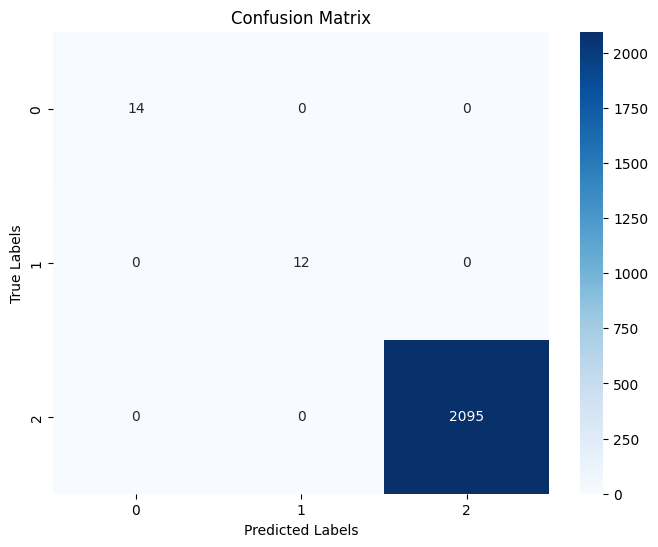

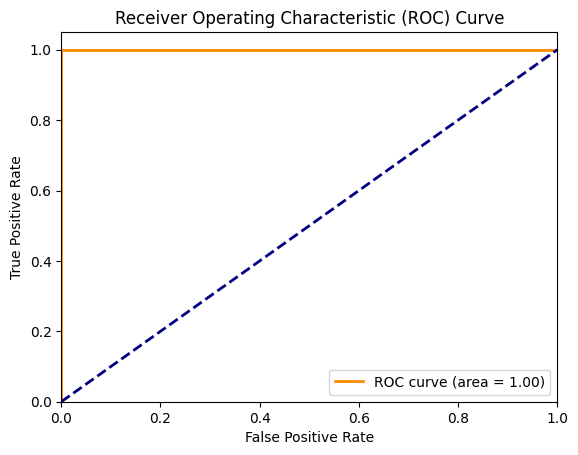

In [30]:
# Derive values for performance study metrics like accuracy, precision, recall, F1 Score and plot them

from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize

# Assuming 'classifier_model' is your trained Decision Tree Classifier
classifier_model = DecisionTreeClassifier(random_state=42)
classifier_model.fit(X_train, y_train)
y_pred = classifier_model.predict(X_test)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred)
display("Accuracy:", accuracy)

# Generate classification report
display(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
display("Confusion Matrix:\n", cm)

# Plot confusion matrix (optional)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Binarize the output
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

# Calculate predicted probabilities
y_pred_proba = classifier_model.predict_proba(X_test) # Calculate the predicted probabilities

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_pred_proba.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curve for a specific class (e.g., class 0)
plt.figure()
plt.plot(fpr[0], tpr[0], color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc[0])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

## 8. Solution

What is the solution that is proposed to solve the business problem discussed in Section 1. Also share the learnings while working through solving the problem in terms of challenges, observations, decisions made etc.

Based on the analysis, the proposed solution is to use a combination of feature selection and machine learning techniques to predict stock prices.

1. **Data Preparation**

    **Data Cleaning and Validation:** Meticulously address inconsistencies, errors, and missing values within the dataset to ensure data integrity.

    **Feature Engineering:** Augment the dataset with derived features such as moving averages, trend indicators, and risk metrics to enhance predictive capabilities.

    **Target Variable Transformation:** Discretize continuous stock price movements into categorical labels to facilitate subsequent classification tasks.

2. **Exploratory Data Analysis**

    **Data Visualization:** Employ graphical representations to discern the distribution of data, interrelationships between variables, and potential patterns.

    **Pattern Recognition:** Identify trends, correlations, and other noteworthy associations within the dataset.

    **Feature Significance Assessment:** Determine the relative importance of various data attributes in predicting stock prices.

3. **Feature Selection**

   Select the most informative features to optimize predictive models and minimize the risk of overfitting.

4. **Machine Learning Models**

   **Model Selection:** Choose appropriate algorithms aligned with specific tasks, such as clustering (e.g., K-means), classification (e.g., Decision Trees, Logistic Regression), or regression (for continuous price predictions).

   **Model Training and Evaluation:** Utilize historical stock data to train selected models and rigorously assess their predictive performance through established metrics (e.g., accuracy, precision, recall, F1-score).


5. **Portfolio Optimization**

   Leverage data analytics to ascertain the optimal allocation of assets within a portfolio, striking a balance between risk and return.
   
   **Diversification Strategy:** Mitigate risk by incorporating a diverse range of stocks from various sectors, judiciously balancing growth-oriented and dividend-yielding securities.

6. **Risk Management**

   **Value At Risk (VAR) Analysis:** Quantify potential financial losses associated with selected investments.

   **Scenario Analysis & Stress Testing:** Evaluate portfolio performance under diverse market conditions, including adverse scenarios, to assess resilience.

   **Portfolio Rebalancing Suggestions**

**Key Findings**

**Data Quality Imperative:** Accurate and reliable data is fundamental to robust analysis and prediction.

**Feature Engineering Significance:** The creation of meaningful derived features substantially enhances predictive capabilities.


**Diversification as Risk Mitigation:** Allocation across diverse sectors is crucial for effective risk management.

**Conclusion:**

This project showcases the application of data science and financial principles to analyze stock market dynamics, predict price movements, and construct well-diversified portfolios. The integration of these methodologies empowers investors with enhanced decision-making capabilities and robust risk management strategies.

**Lessons Learned:**

**Model Limitations:** Predictive models, while valuable, are inherently imperfect and cannot fully encapsulate the complexities of the market.

**Past Performance Non-Predictive:** Historical performance does not guarantee future outcomes. Models necessitate continuous updates and adaptation.

**Risk Management Primacy:** Prudent investment practices, including diversification and ongoing risk assessment, remain paramount.
has context menu